In [1]:
#Clean and scale dataset to prepare for unsupervised learning

import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load data
df = pd.read_csv("Resources/pnw_final.csv")

# Drop non-informative, ID, timestamp, and reviewer-derived fields
df = df.drop(columns=[
    'time', 'id', 'updated', 'place', 'net', 'status', 'locationSource', 'magSource',
    'gap', 'magError', 'nst', 'magNst', 'type'
])

# Convert 'magType' to dummy variables
df = pd.get_dummies(df, columns=['magType'], drop_first=True)

# Drop rows with missing values
df = df.dropna()

# Drop 'mag' for clustering (but keep it if needed for cluster interpretation)
df_features = df.drop(columns=['mag'])

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

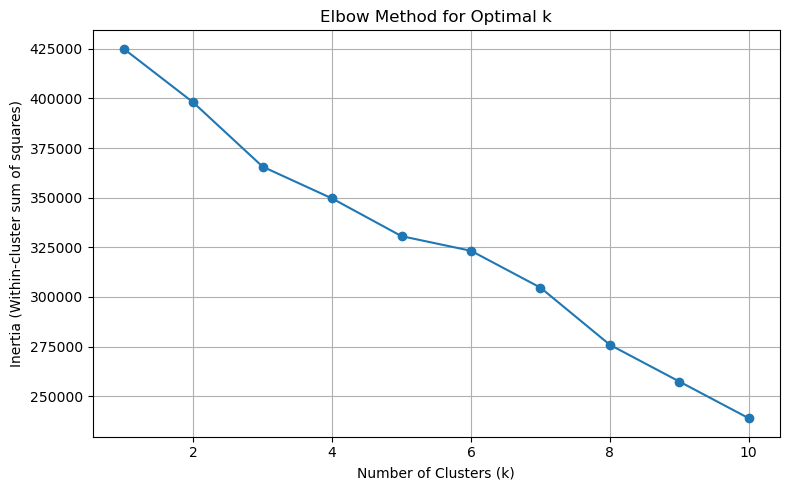

In [2]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Choose the number of clusters using the Elbow Method
inertia = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Step 2: Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Within-cluster sum of squares)')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.tight_layout()
plt.show()

In [3]:
# Apply KMeans with k=4
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster assignments to the original DataFrame
df['cluster'] = clusters

# Preview the result
df[['mag', 'cluster']].head()

,mag,cluster
0,2.70,2
1,2.74,3
2,3.50,0
3,2.93,0
4,2.95,2


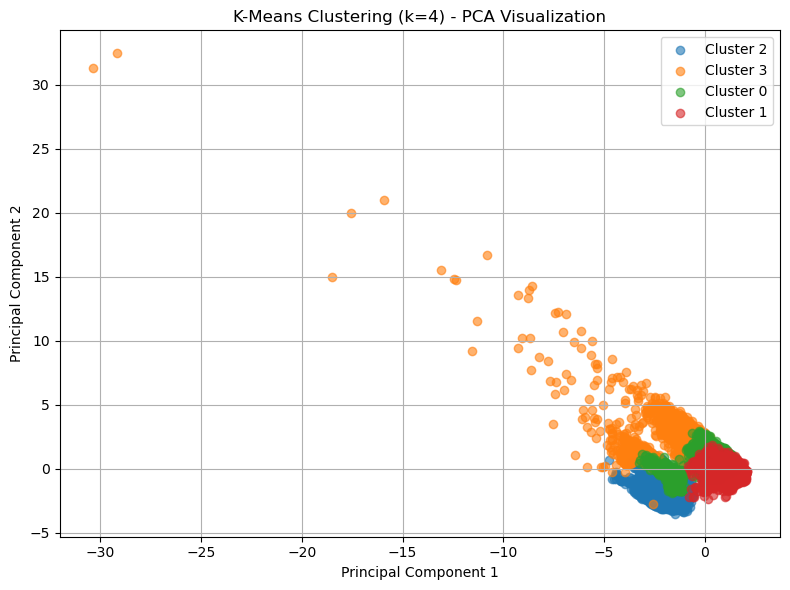

Cluster Feature Means:


,latitude,longitude,depth,mag,dmin,rms,horizontalError,depthError,year,month,...,magType_ma,magType_mb,magType_mc,magType_md,magType_mh,magType_ml,magType_ms,magType_mw,magType_mwr,magType_mww
cluster,,,,,,,,,,,,,,,,,,,,,
0,40.473615,-123.636267,15.606603,2.890307,0.215387,0.123942,1.276320,1.513746,1999.117580,6.486369,...,0.00000,0.006497,0.000000,0.934013,0.003694,0.000000,0.00051,0.055287,0.000000,0.000000
1,46.285593,-121.797158,4.307225,3.025860,0.118300,0.207240,0.610838,1.106890,1992.047550,6.604444,...,0.00000,0.011213,0.000000,0.988372,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
2,42.069069,-121.573995,12.410751,3.099614,0.274651,0.202868,1.035716,2.712512,2006.762889,6.961395,...,0.00000,0.000249,0.000747,0.000000,0.000000,0.993524,0.00000,0.001494,0.003487,0.000000
3,40.870619,-124.613185,11.866232,3.009243,0.742263,0.405167,7.706434,17.106954,1998.429048,7.109627,...,0.00946,0.000000,0.000000,0.800779,0.003339,0.136895,0.00000,0.048414,0.000000,0.000556


In [4]:
from sklearn.decomposition import PCA

# Step 1: Apply PCA to reduce to 2D for visualization
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['cluster'] = df['cluster']

# Step 2: Visualize clusters in 2D PCA space
plt.figure(figsize=(8, 6))
for cluster in pca_df['cluster'].unique():
    cluster_points = pca_df[pca_df['cluster'] == cluster]
    plt.scatter(cluster_points['PC1'], cluster_points['PC2'], label=f'Cluster {cluster}', alpha=0.6)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering (k=4) - PCA Visualization')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 3: Cluster profiling - mean of each feature by cluster
cluster_profile = df.groupby('cluster').mean(numeric_only=True)
print("Cluster Feature Means:")
display(cluster_profile)

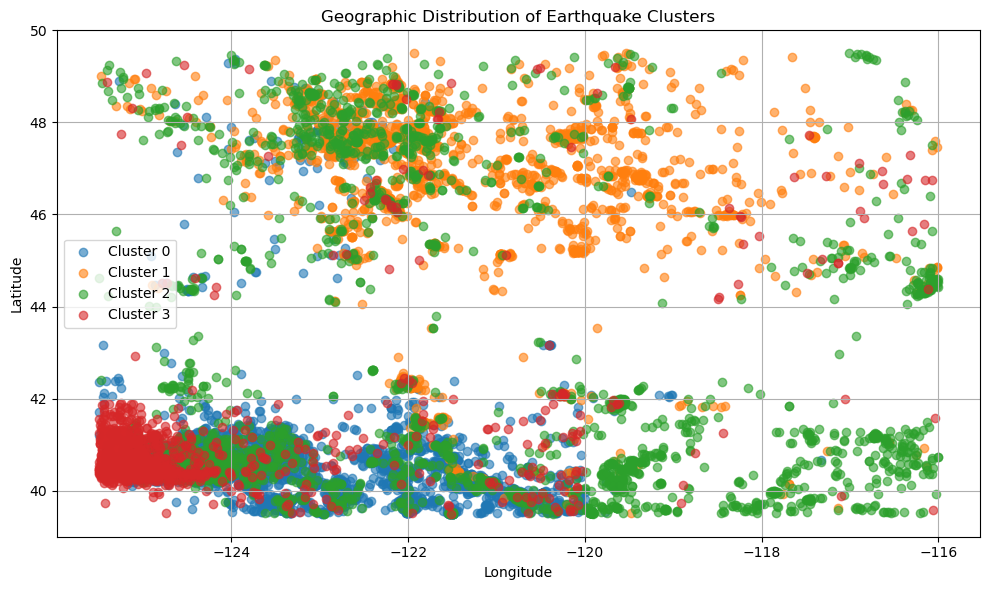

In [6]:
# Add clusters to a copy of the dataframe
df_geo = df.copy()
df_geo['cluster'] = clusters  # <- This is from your existing code

# Plot Latitude vs Longitude, colored by cluster
plt.figure(figsize=(10, 6))
for cluster in sorted(df_geo['cluster'].unique()):
    cluster_data = df_geo[df_geo['cluster'] == cluster]
    plt.scatter(cluster_data['longitude'], cluster_data['latitude'], label=f'Cluster {cluster}', alpha=0.6)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographic Distribution of Earthquake Clusters')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#pip install folium

Note: you may need to restart the kernel to use updated packages.


In [16]:
import folium
from branca.element import Element

# Define colors and clusters
colors = ['red', 'blue', 'green', 'purple', 'orange']
cluster_labels = sorted(df['cluster'].unique())

# Create map
map_center = [df['latitude'].mean(), df['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=6, tiles='CartoDB positron')

# Add markers
for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,
        color=colors[row['cluster'] % len(colors)],
        fill=True,
        fill_opacity=0.7,
        weight=0
    ).add_to(m)

# Legend HTML (no macros, just plain HTML)
legend_html = f"""
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 160px;
    background-color: white;
    border: 2px solid gray;
    border-radius: 6px;
    padding: 10px;
    z-index:9999;
    font-size:14px;
">
<b>Cluster Legend</b><br>
{''.join([
    f'<i style="background:{colors[label % len(colors)]}; '
    f'width:10px; height:10px; display:inline-block; margin-right:5px;"></i>'
    f'Cluster {label}<br>'
    for label in cluster_labels
])}
</div>
"""

# Attach legend to map using Element
legend_element = Element(legend_html)
m.get_root().html.add_child(legend_element)

# Display map
m

          mag  depth   rms  dmin  horizontalError  depthError     year
cluster                                                               
0        2.89  15.61  0.12  0.22             1.28        1.51  1999.12
1        3.03   4.31  0.21  0.12             0.61        1.11  1992.05
2        3.10  12.41  0.20  0.27             1.04        2.71  2006.76
3        3.01  11.87  0.41  0.74             7.71       17.11  1998.43


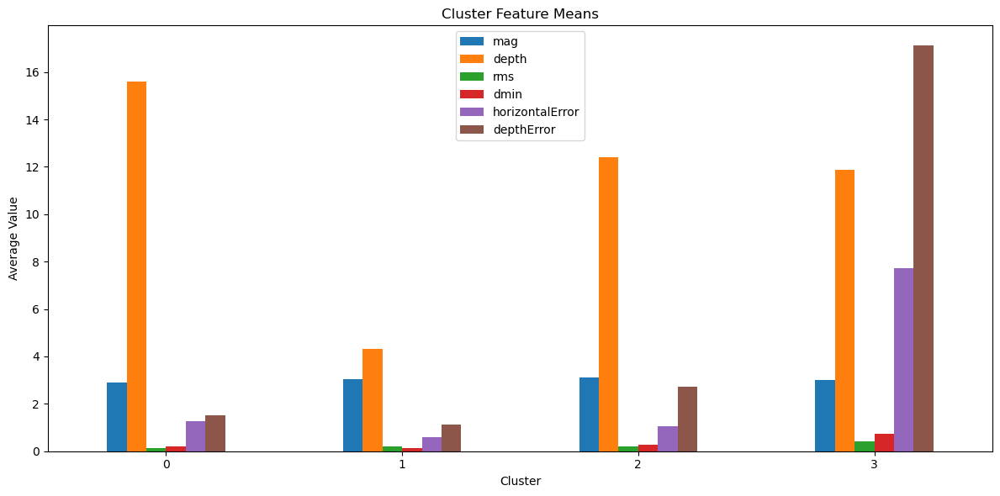

In [ ]:
# Group by cluster and calculate the mean for each feature
cluster_stats = df.groupby('cluster')[['mag', 'depth', 'rms', 'dmin', 'year']].mean()

# Optionally round for easier viewing
cluster_stats = cluster_stats.round(2)

# Display the result
print(cluster_stats)

cluster_stats.drop(columns='year').plot(kind='bar', figsize=(12, 6))
plt.title("Cluster Feature Means")
plt.ylabel("Average Value")
plt.xlabel("Cluster")
plt.xticks(rotation=0)
plt.tight_layout()

plt.show()

✅ Magnitude (mag)
Fairly consistent across all clusters (all around ~3.0).

This suggests magnitude is not a strong driver of clustering.

📉 Depth
Cluster 1 has significantly shallower earthquakes, averaging around ~4 km.

Clusters 0, 2, and 3 show much deeper events, ranging from ~12 to ~16 km.

📊 Other observations:
Cluster 3 stands out for very high depthError and horizontalError, suggesting these events may be less precisely located.

Cluster 1 also shows lower error values, which might reflect clearer recordings (perhaps due to the shallow depth?).